# Credit Risk Modelling

## Imports

In [1]:
from IPython.display import display 
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
#-----------------Plots
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler 
#-----------------Pre-processing
import category_encoders as ce
from sklearn.preprocessing import LabelEncoder as le
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import make_pipeline
#-----------------Feature Importance
from sklearn.feature_selection import SelectKBest, f_classif ,mutual_info_classif
from sklearn.feature_selection import SelectFromModel
import helper_funcs as hf
#-----------------Modelling
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier 
# from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier
#-----------------Scores and Metrics
from sklearn.model_selection import cross_val_score as cv_score
#-----------------Dataset
df = pd.read_csv('dataset/credit_risk_dataset.csv')
fig_dir = "figures/"

## Data Understanding

In [2]:
column_rename = {
    'person_age':'age',
    'person_income':'income',
    'person_home_ownership':'home_ownership',
    'person_emp_length':'emp_length',
    'loan_int_rate':'interest_rate',
    'loan_status':'status',
    'loan_amnt':'amount',
    'loan_grade':'grade',
    'cb_person_default_on_file' :'historical_default',    
    'cb_person_cred_hist_length':'cred_history_length', 
}
df = df.rename(columns = column_rename)
binary_map = {
    0:'No',
    1:'Yes'
}
df.status = df.status.map(binary_map)
display(df.head())
print(f"Observations: {df.shape[0]} , Features: {df.shape[1]}")

,age,income,home_ownership,emp_length,loan_intent,grade,amount,interest_rate,status,loan_percent_income,historical_default,cred_history_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,Yes,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,No,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,Yes,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,Yes,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,Yes,0.55,Y,4


Observations: 32581 , Features: 12


### Feature Description

In [3]:
feats = df.columns.values
numeric_feats = df._get_numeric_data().columns.values
cat_feats = list(set(feats) - set(numeric_feats))

print("Features:\n",feats,'\n\n')
print("Numerical Features:\n",numeric_feats,'\n\n')
print("Categorical Features:\n",cat_feats,'\n\n')
print('Feature Datatypes')
print(df.dtypes)

Features:
 ['age' 'income' 'home_ownership' 'emp_length' 'loan_intent' 'grade'
 'amount' 'interest_rate' 'status' 'loan_percent_income'
 'historical_default' 'cred_history_length'] 


Numerical Features:
 ['age' 'income' 'emp_length' 'amount' 'interest_rate'
 'loan_percent_income' 'cred_history_length'] 


Categorical Features:
 ['loan_intent', 'home_ownership', 'grade', 'status', 'historical_default'] 


Feature Datatypes
age                      int64
income                   int64
home_ownership          object
emp_length             float64
loan_intent             object
grade                   object
amount                   int64
interest_rate          float64
status                  object
loan_percent_income    float64
historical_default      object
cred_history_length      int64
dtype: object


In [4]:
for feat in cat_feats:
    print(feat , ':',df[feat].unique())

loan_intent : ['PERSONAL' 'EDUCATION' 'MEDICAL' 'VENTURE' 'HOMEIMPROVEMENT'
 'DEBTCONSOLIDATION']
home_ownership : ['RENT' 'OWN' 'MORTGAGE' 'OTHER']
grade : ['D' 'B' 'C' 'A' 'E' 'F' 'G']
status : ['Yes' 'No']
historical_default : ['Y' 'N']


### Target Variable Balance Before Dealing with Missing Values

In [5]:
num_positive_target = len(df.loc[df.status=='Yes'])
num_negative_target = len(df.loc[df.status=='No'])
percentage_positive = round((num_positive_target/df.shape[0])*100,2)
percentage_negative = round((num_negative_target/df.shape[0])*100,2)
print('Number of positive target observations:',num_positive_target)
print('Number of negative target observations:',num_negative_target)
print(f'Percentage positive target variables: {percentage_positive} %')
print(f'Percentage negative target variables: {percentage_negative} %')
fig = px.pie(
    df, 
    names='status',
    color_discrete_sequence=px.colors.diverging.balance,
    title='Target Variable Ratio'
)
# fig.write_image(fig_dir+"default_ratio_before.png")
fig.show()


Number of positive target observations: 7108
Number of negative target observations: 25473
Percentage positive target variables: 21.82 %
Percentage negative target variables: 78.18 %


### Missing Values

In [6]:
print("Missing values per feature\n")
null_features = df.isnull().sum() 
print(null_features,'\n')
percent_missing_emp_length = round((null_features['emp_length']/df.shape[0]*100),2)
percent_missing_int_rate = round((null_features['interest_rate']/df.shape[0]*100),2)

print(f'% values missing for emp_length: {percent_missing_emp_length}% ')
print(f'% values missing for interest_rate: {percent_missing_int_rate}% ')
rows_with_missing = df.shape[0] - df.dropna().shape[0]
percent_rows_missing = round(rows_with_missing/df.shape[0],4)*100
print('Number of rows with at least one missing value: ', rows_with_missing)
print('Percentage of rows with at least one missing value:', percent_rows_missing,'%')
df = df.dropna(axis=0) 


Missing values per feature

age                       0
income                    0
home_ownership            0
emp_length              895
loan_intent               0
grade                     0
amount                    0
interest_rate          3116
status                    0
loan_percent_income       0
historical_default        0
cred_history_length       0
dtype: int64 

% values missing for emp_length: 2.75% 
% values missing for interest_rate: 9.56% 
Number of rows with at least one missing value:  3943
Percentage of rows with at least one missing value: 12.1 %


### Target Variable Balance After Dealing with Missing Values

In [7]:
num_positive_target = len(df.loc[df.status=='Yes'])
num_negative_target = len(df.loc[df.status=='No'])
percentage_positive = round((num_positive_target/df.shape[0])*100,2)
percentage_negative = round((num_negative_target/df.shape[0])*100,2)
print('Number of positive target observations:',num_positive_target)
print('Number of negative target observations:',num_negative_target)
print(f'Percentage positive target variables: {percentage_positive} %')
print(f'Percentage negative target variables: {percentage_negative} %')
fig = px.pie(
    df, 
    names='status',
    color_discrete_sequence=px.colors.diverging.balance,
    title='Target Variable Ratio'
)
# fig.write_image(fig_dir+"default_ratio_after.png")
fig.show()

print("Missing values per feature\n")
null_features = df.isnull().sum() 
print(null_features,'\n')
percent_missing_emp_length = round((null_features['emp_length']/df.shape[0]*100),2)
percent_missing_int_rate = round((null_features['interest_rate']/df.shape[0]*100),2)

print(f'% values missing for emp_length: {percent_missing_emp_length}% ')
print(f'% values missing for interest_rate: {percent_missing_int_rate}% ')
rows_with_missing = df.shape[0] - df.dropna().shape[0]
percent_rows_missing = round(rows_with_missing/df.shape[0],4)*100
print('Number of rows with at least one missing value: ', rows_with_missing)
print('Percentage of rows with at least one missing value:', percent_rows_missing,'%')
df = df.dropna(axis=0) 

Number of positive target observations: 6203
Number of negative target observations: 22435
Percentage positive target variables: 21.66 %
Percentage negative target variables: 78.34 %


Missing values per feature

age                    0
income                 0
home_ownership         0
emp_length             0
loan_intent            0
grade                  0
amount                 0
interest_rate          0
status                 0
loan_percent_income    0
historical_default     0
cred_history_length    0
dtype: int64 

% values missing for emp_length: 0.0% 
% values missing for interest_rate: 0.0% 
Number of rows with at least one missing value:  0
Percentage of rows with at least one missing value: 0.0 %


### Data Quality Report

In [8]:
print('Data Quality Report for Numerical Features')
display(df.describe())
print('Data Quality Report for Categorical Features')
display(df.describe(include='object'))

Data Quality Report for Numerical Features


,age,income,emp_length,amount,interest_rate,loan_percent_income,cred_history_length
count,28638.000000,2.863800e+04,28638.000000,28638.000000,28638.000000,28638.000000,28638.000000
mean,27.727216,6.664937e+04,4.788672,9656.493121,11.039867,0.169488,5.793736
std,6.310441,6.235645e+04,4.154627,6329.683361,3.229372,0.106393,4.038483
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,2.000000
25%,23.000000,3.948000e+04,2.000000,5000.000000,7.900000,0.090000,3.000000
50%,26.000000,5.595600e+04,4.000000,8000.000000,10.990000,0.150000,4.000000
75%,30.000000,8.000000e+04,7.000000,12500.000000,13.480000,0.230000,8.000000
max,144.000000,6.000000e+06,123.000000,35000.000000,23.220000,0.830000,30.000000


Data Quality Report for Categorical Features


,home_ownership,loan_intent,grade,status,historical_default
count,28638,28638,28638,28638,28638
unique,4,6,7,2,2
top,RENT,EDUCATION,A,No,N
freq,14551,5704,9402,22435,23535


### Feature Visualisation

##### Scatter Plot Matrix

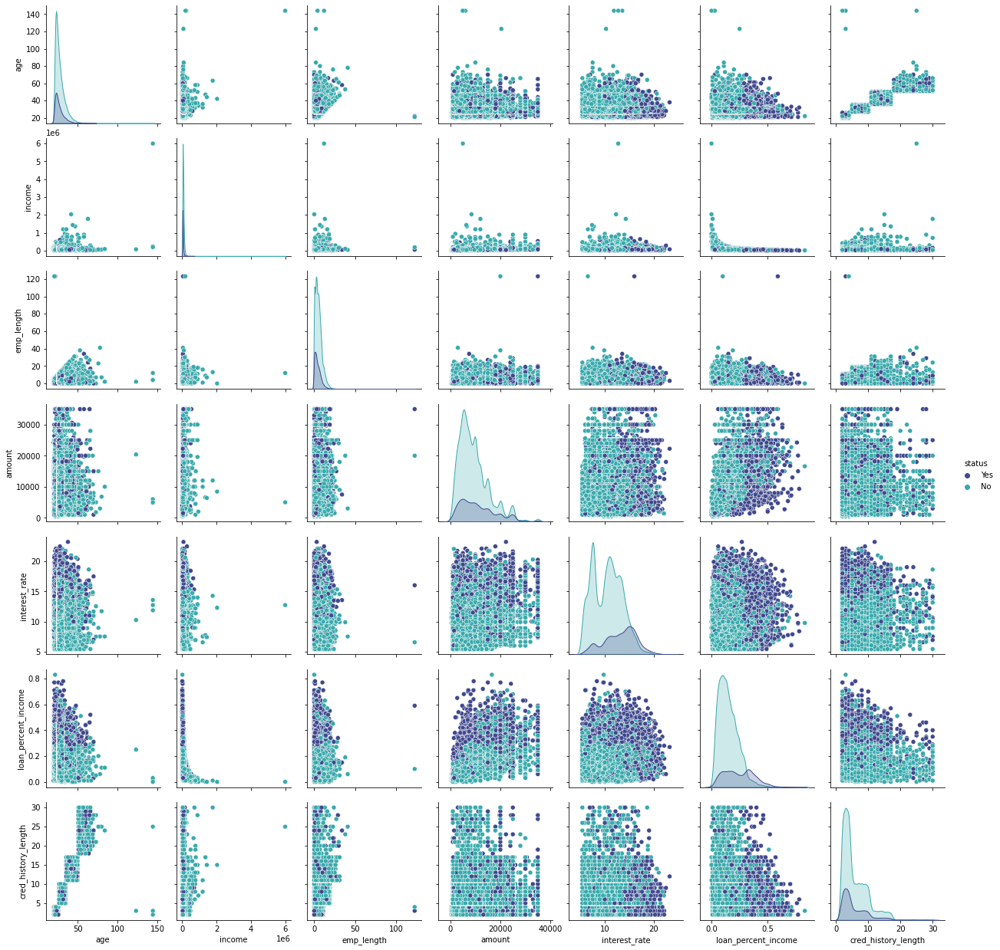

In [9]:
sns.pairplot(df, hue="status",palette = 'mako')

##### Inter-feature Correlation

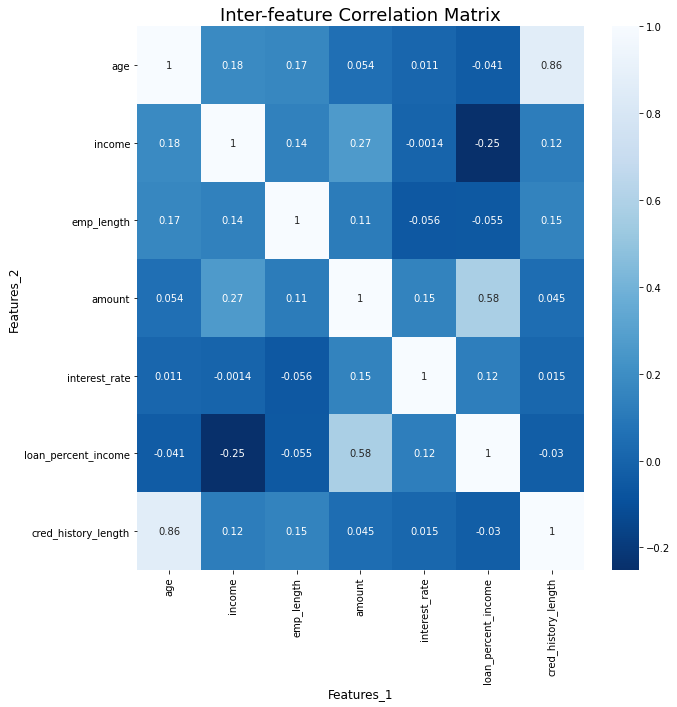

In [10]:
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(df.corr(),annot=True,cmap='Blues_r')
plt.title('Inter-feature Correlation Matrix',fontsize=18)
plt.xlabel('Features_1' , fontsize = 12)
plt.ylabel('Features_2' , fontsize = 12)
plt.savefig(fig_dir+'feat_corr_0.png')

##### Feature Distributions

###### Numeric Features

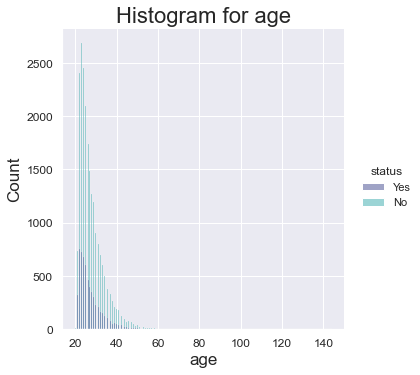

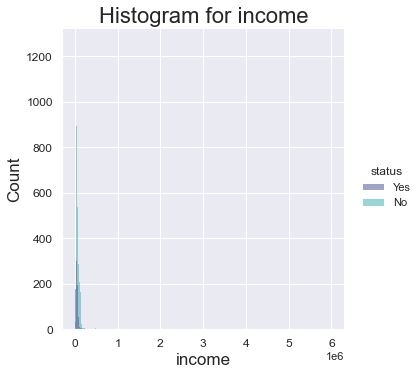

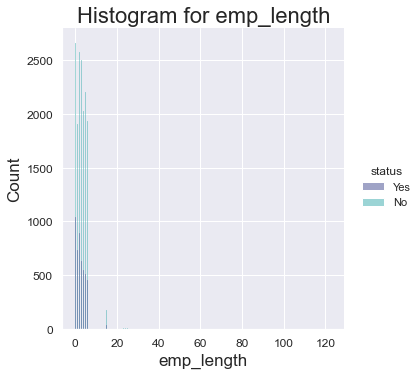

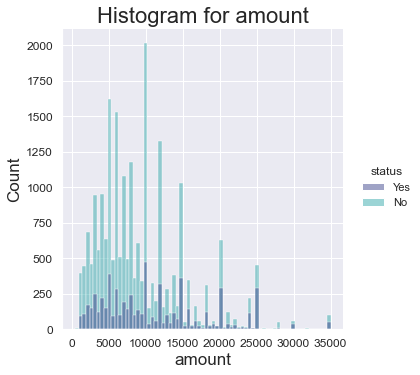

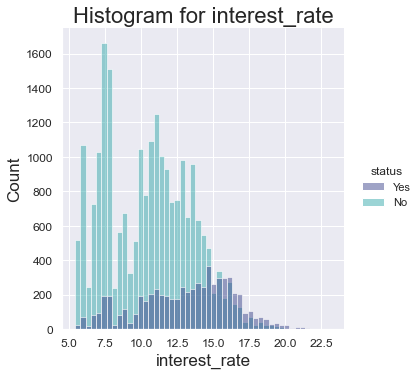

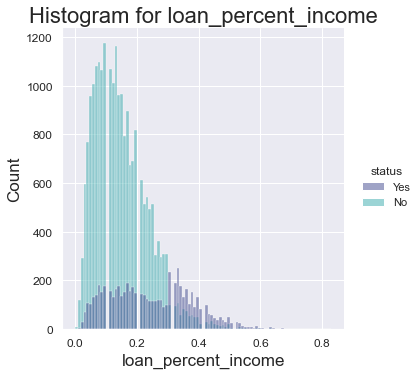

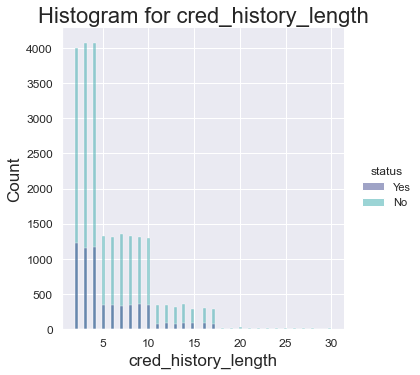

In [11]:
sns.set(rc={'figure.figsize':(20,10)})
sns.set(rc={'figure.figsize':(20,10)})
width = 15
height = 8
feats = list(numeric_feats)
for feature in feats:
    sns.displot(
        df,x=feature,
        hue='status', 
        palette = 'mako',
#         rug_kws=dict(edgecolors=None, linewidth=0),
#         height=height, aspect=width/height,
        kind="hist",
        legend=True,
#         bins=50
    )
    plt.title(f'Histogram for {feature}', fontsize=22)
    plt.xlabel(f'{feature}' , fontsize=17)
    plt.ylabel('Count', fontsize=17)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.savefig(fig_dir+f'{feature}_hist.png')
    plt.show()

###### Categorical Features

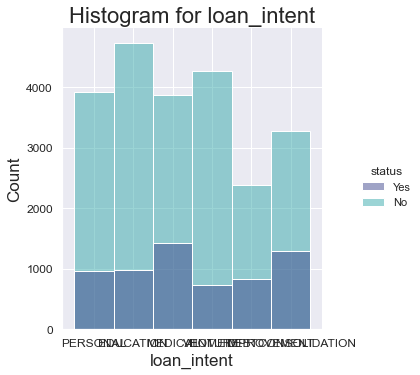

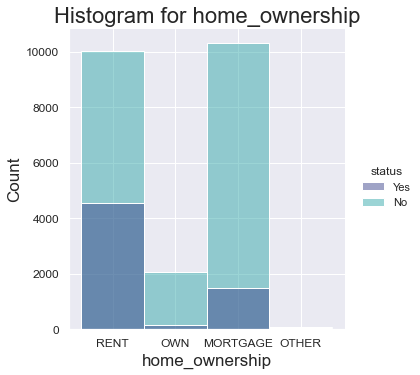

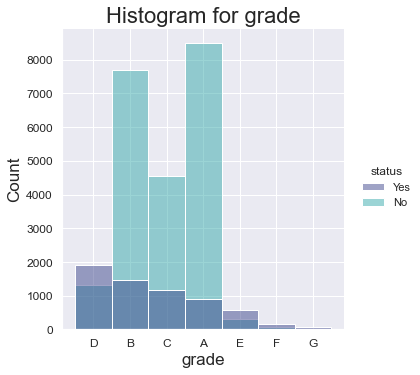

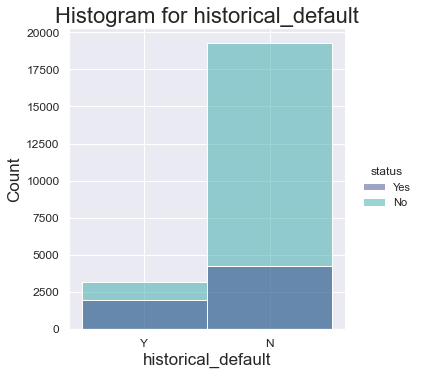

In [12]:
sns.set(rc={'figure.figsize':(20,10)})
sns.set(rc={'figure.figsize':(20,10)})
width = 15
height = 8
feats = list(cat_feats)
feats.remove('status')
for feature in feats:
    sns.displot(
        df,x=feature,
        hue='status', 
        palette = 'mako',
#         rug_kws=dict(edgecolors=None, linewidth=0),
#         height=height, aspect=width/height,
        kind="hist",
        legend=True
    )
    plt.title(f'Histogram for {feature}', fontsize=22)
    plt.xlabel(f'{feature}' , fontsize=17)
    plt.ylabel('Count', fontsize=17)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.savefig(fig_dir+f'{feature}_hist.png')
    plt.show()

#### Box Plots

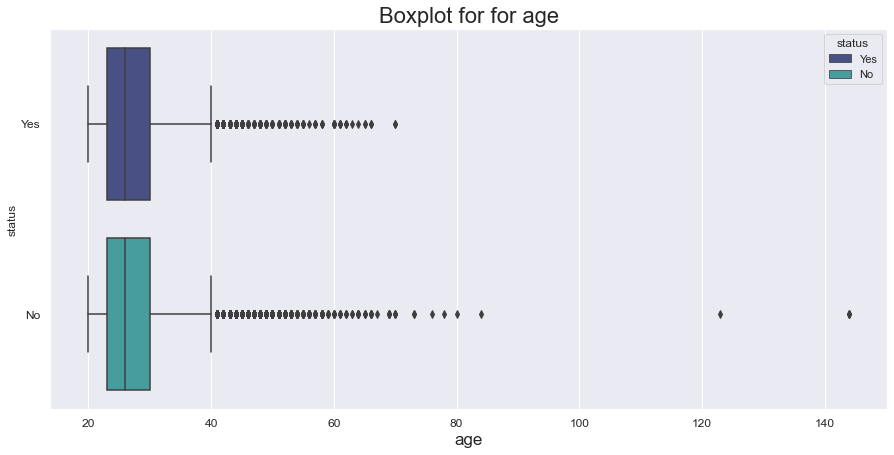

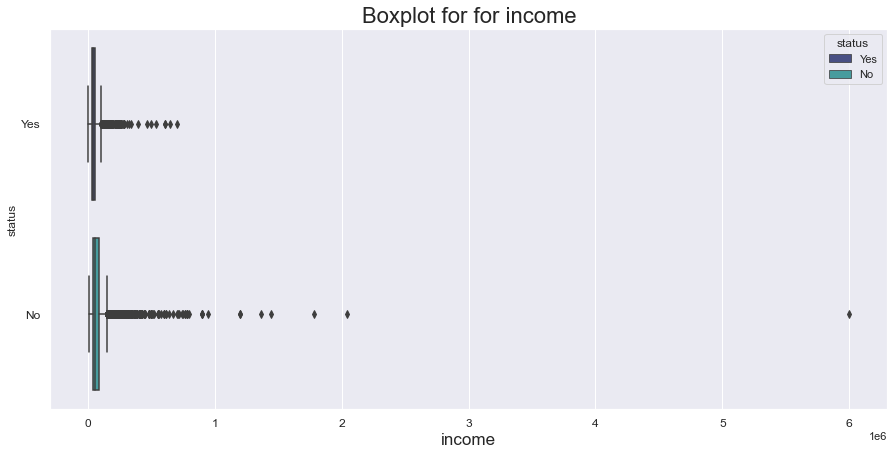

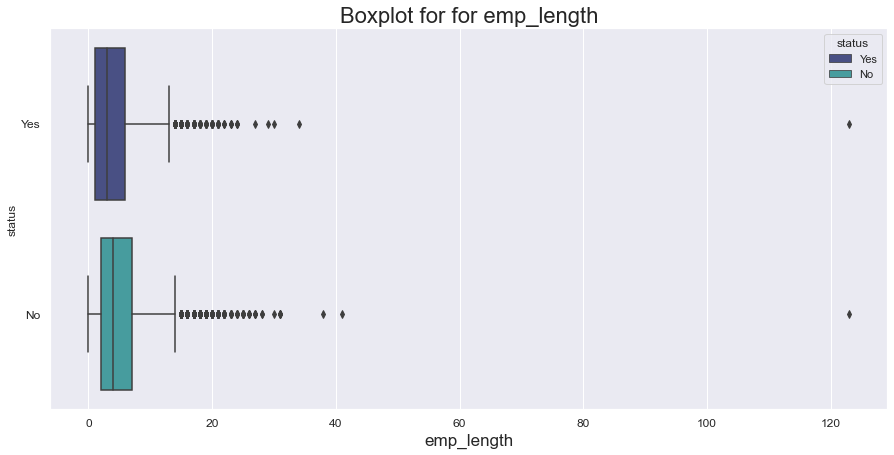

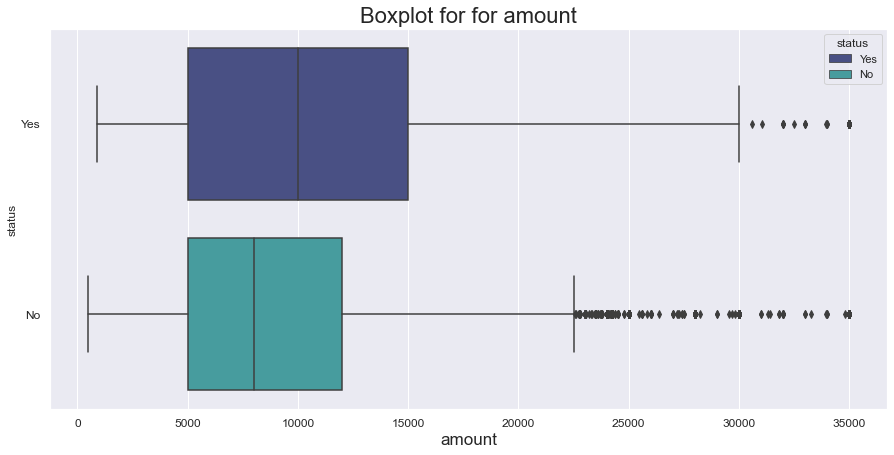

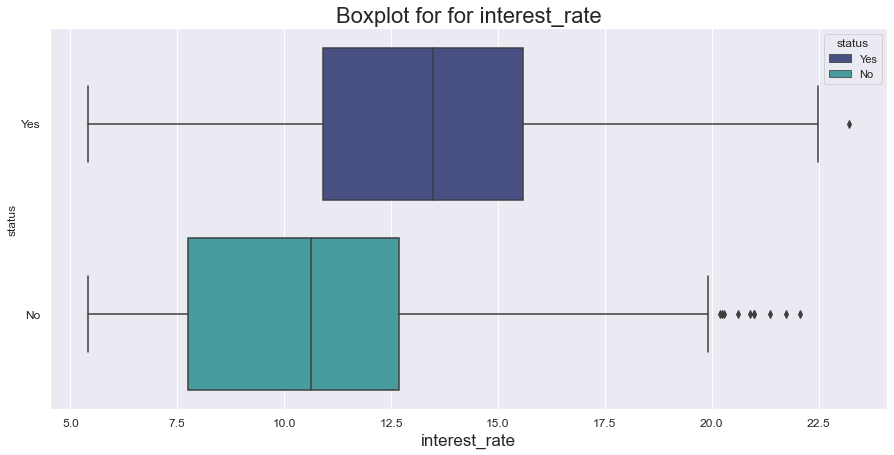

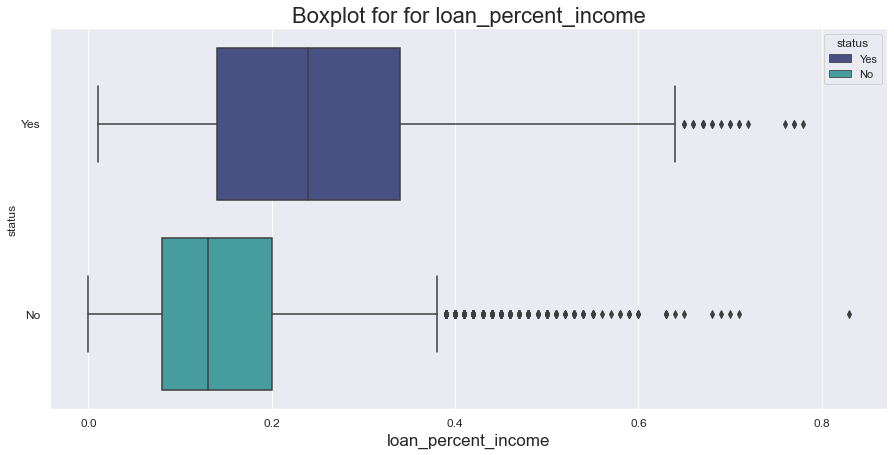

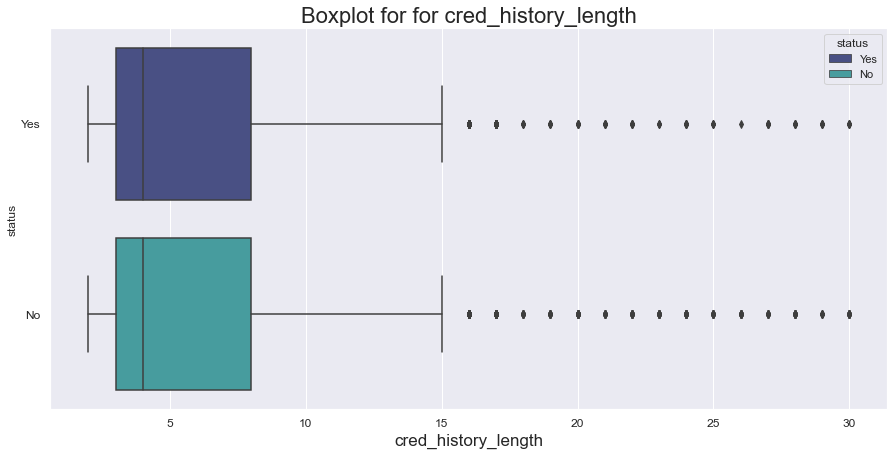

In [13]:
sns.set(rc={'figure.figsize':(15,7)})
width = 15
height = 8
feats = list(numeric_feats)
for feature in feats:
    fig=sns.boxplot(
        x=df[feature],
        y=df['status'],
        hue=df['status'], 
        palette = 'mako',
#         fliersize = 1.25,
        dodge=False
    )
    plt.title(f'Boxplot for for {feature}', fontsize=22)
    plt.xlabel(f'{feature}' , fontsize=17)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.savefig(fig_dir+f'{feature}_box.png')
    plt.show()

#### Violin Plots

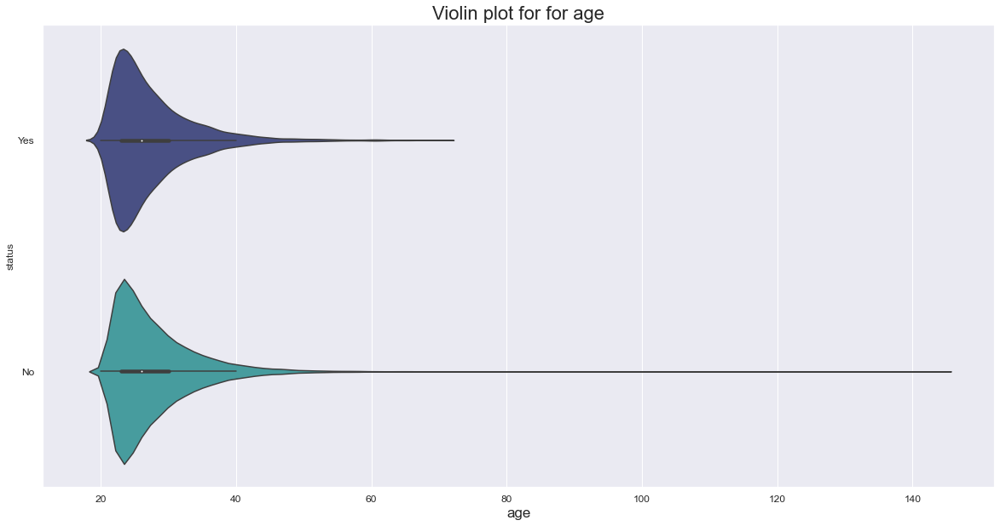

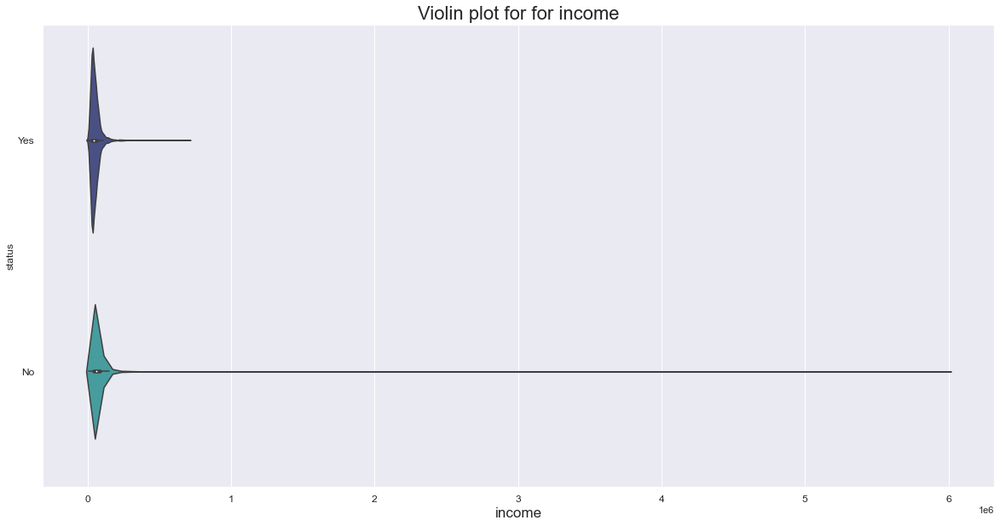

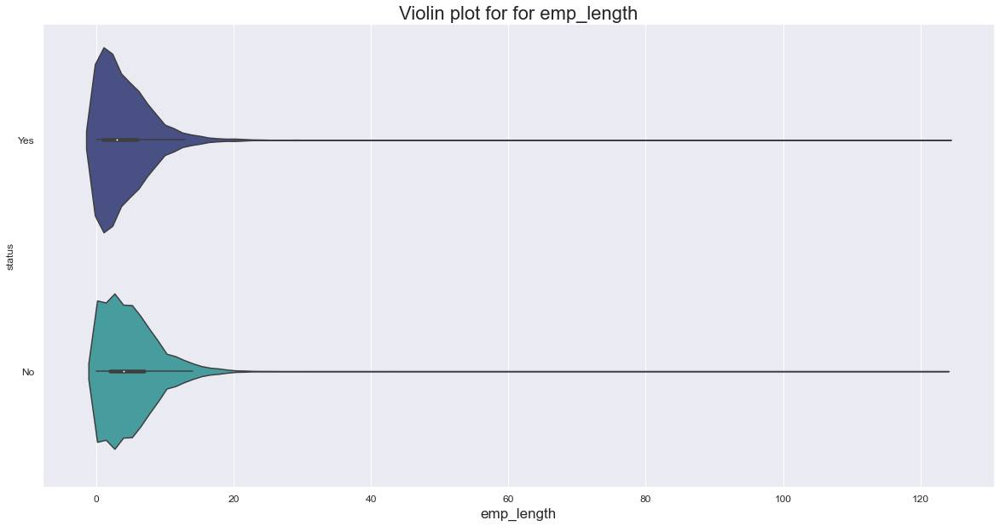

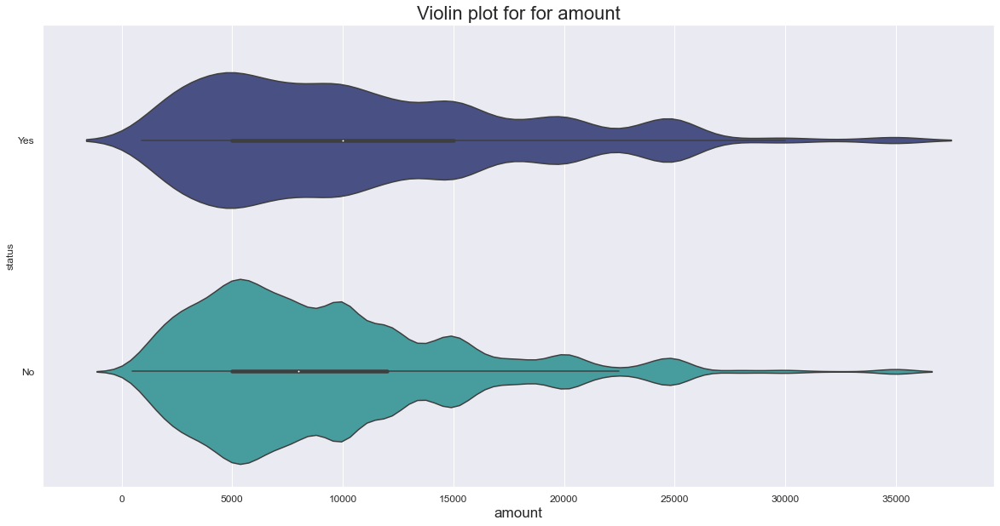

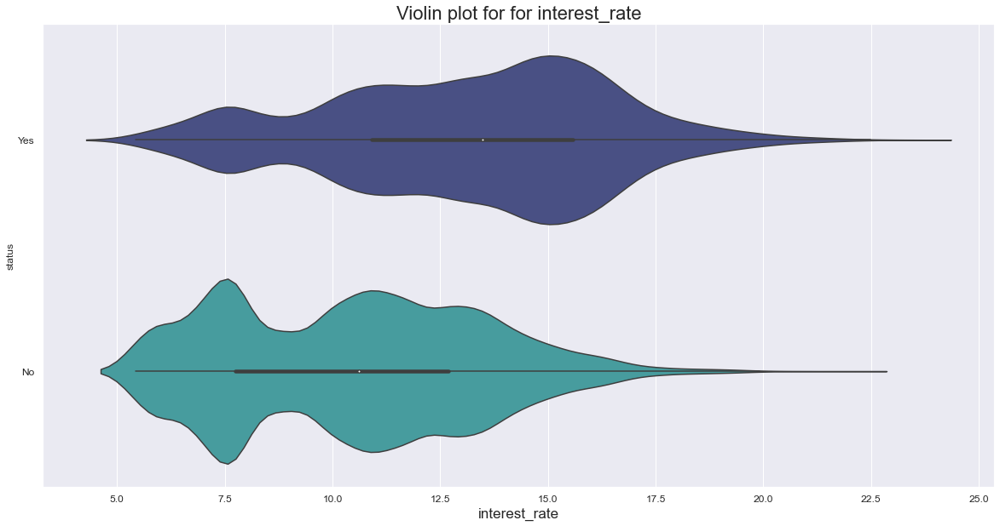

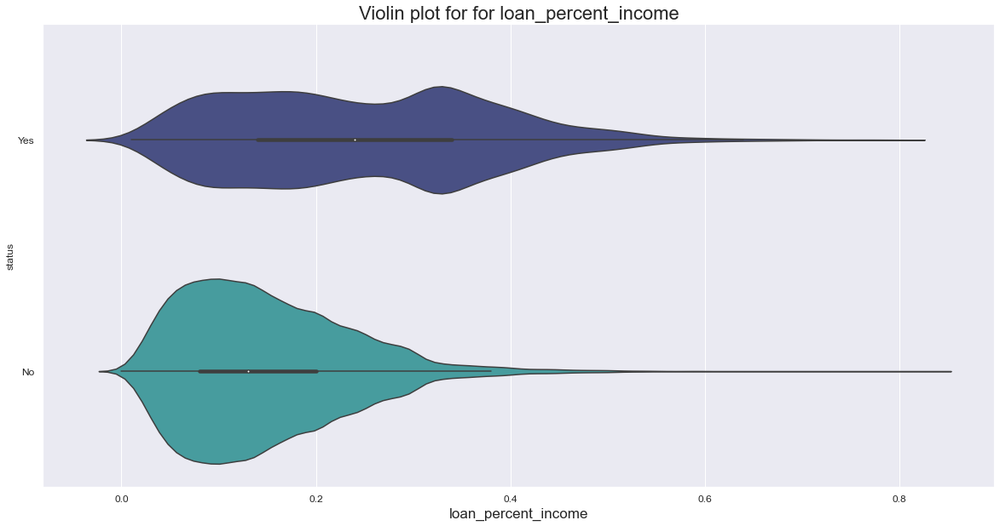

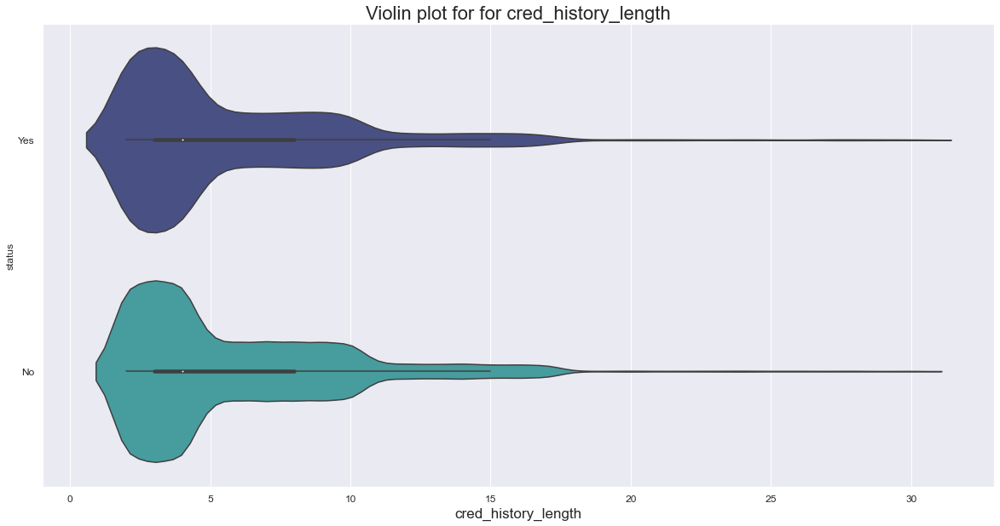

In [14]:
sns.set(rc={'figure.figsize':(20,10)})
width = 15
height = 8
feats = list(numeric_feats)
for feature in feats:
    fig=sns.violinplot(
        data = df,
        x=feature, 
        y='status',
#         hue='status', 
        palette = 'mako',
        split=True
    )
    plt.title(f'Violin plot for for {feature}', fontsize=22)
    plt.xlabel(f'{feature}' , fontsize=17)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.savefig(fig_dir+f'{feature}_box.png')
    plt.show()

#### Parallel Category Diagram

In [15]:
#Parallel category diagram
color = [(0.00, "teal"),   (0.5, "teal"),
         (0.5, "navy"),  (1.00, "navy")]

feats = list(cat_feats)
feats.remove('status')
fig = px.parallel_categories(
    df, 
    color_continuous_scale=color, 
    color=df.status.map({'Yes':1,'No':0}),
    dimensions=feats
)
fig.show()

### Outliers

In [16]:
def detect_outliers(df,feature):
    outlier_indices = []
    c=feature
    Q1 = np.percentile(df[c],25)
    Q3 = np.percentile(df[c],75)
    IQR = Q3 - Q1
    outlier_step = IQR * 1.5
    upper = outlier_step+Q3
    lower = Q1-outlier_step
    outlier_list_col = df[(df[c] < lower) | (df[c] > upper)].index

    return df[(df[c] < Q1 - outlier_step) | (df[c] > Q3 + outlier_step)] , upper , lower


In [17]:
for feat in numeric_feats:
    outliers , upper, lower = detect_outliers(df,feat)
    print(f'Feature: {feat}, Upper: {round(upper,2)}, Lower: {round(lower,2)}, Count: {len(outliers)}')

Feature: age, Upper: 40.5, Lower: 12.5, Count: 1298
Feature: income, Upper: 140780.0, Lower: -21300.0, Count: 1329
Feature: emp_length, Upper: 14.5, Lower: -5.5, Count: 773
Feature: amount, Upper: 23750.0, Lower: -6250.0, Count: 1484
Feature: interest_rate, Upper: 21.85, Lower: -0.47, Count: 6
Feature: loan_percent_income, Upper: 0.44, Lower: -0.12, Count: 557
Feature: cred_history_length, Upper: 15.5, Lower: -4.5, Count: 984


## Data Preparation

### Outliers

In [18]:
df_clamp = df.copy()
def clamp_outliers(df,feature):
    df_rows , upper, lower  = detect_outliers(df,feature)
    df_new = df.copy()
    for row in df_rows.index:
        if df_rows.loc[row,feature] > upper:
            df_new.loc[row,feature] = upper
        elif df_rows.loc[row,feature] < lower:
            df_new.loc[row,feature] = lower            
    return df_new

for feat in numeric_feats:
    df_clamp[feat] = clamp_outliers(df,feat)[feat]

for feat in numeric_feats:
    outliers , upper, lower = detect_outliers(df_clamp,feat)
    print(f'Feature: {feat}, Upper:{round(upper,2)}, Lower: {round(lower,2)}, Count: {len(outliers)}')

Feature: age, Upper:40.5, Lower: 12.5, Count: 0
Feature: income, Upper:140780.0, Lower: -21300.0, Count: 0
Feature: emp_length, Upper:14.5, Lower: -5.5, Count: 0
Feature: amount, Upper:23750.0, Lower: -6250.0, Count: 0
Feature: interest_rate, Upper:21.85, Lower: -0.47, Count: 0
Feature: loan_percent_income, Upper:0.44, Lower: -0.12, Count: 0
Feature: cred_history_length, Upper:15.5, Lower: -4.5, Count: 0


In [19]:
cv_metric = 'precision_weighted'
rand_state=42
encoder = le()
df_enc = df.copy()
df_enc_clamp = df_clamp.copy()
df_d = df.copy()
#Removing outliers
df_d = df_d[df_d["age"]<=100]
df_d = df_d[df_d["emp_length"]<=100]
df_d = df_d[df_d["income"]<= 4000000]
df_d_enc = df_d.copy()

for feat in cat_feats:
    df_enc[feat] = encoder.fit_transform(df_enc[feat].values)
    df_enc_clamp[feat] = encoder.fit_transform(df_enc_clamp[feat].values)
    df_d_enc[feat] = encoder.fit_transform(df_d[feat].values)

X = df_enc.drop('status',axis=1)
y= df_enc.status
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=rand_state)

X_clamp = df_enc_clamp.drop('status',axis=1)
y_clamp = df_enc_clamp.status
X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(X_clamp, y_clamp, test_size=0.2, random_state=rand_state)


X_d = df_d_enc.drop('status',axis=1)
y_d= df_d_enc.status
X_train_d, X_test_d, y_train_d, y_test_d = train_test_split(X_d, y_d, test_size=0.2, random_state=42)

# clf = DecisionTreeClassifier(random_state=42)
clf =DecisionTreeClassifier(random_state=rand_state)
scores = cv_score(clf , X_train , y_train,cv=5,scoring=cv_metric).mean()
scores_clamp = cv_score(clf , X_train_c , y_train_c , cv=5 , scoring=cv_metric).mean()
scores_d = cv_score(clf , X_train_d , y_train_d,cv=5,scoring=cv_metric).mean()


print(f'CV Score without outlier clamping: {scores}')
print(f'CV Score with outlier clamping: {scores_clamp}')
print(f'CV Score with removing extreme outliers: {scores_d}')
print(f'Clamped Score - Normal Score= {scores_clamp.mean()-scores.mean()}')
print(f'Removed Score - Normal Score= {scores_d.mean()-scores.mean()}')

CV Score without outlier clamping: 0.8846864943005788
CV Score with outlier clamping: 0.883832067190095
CV Score with removing extreme outliers: 0.8861965185281188
Clamped Score - Normal Score= -0.0008544271104837797
Removed Score - Normal Score= 0.0015100242275399856


### SMOTE 

In [20]:
smt = SMOTE(random_state=rand_state)
pipeline = make_pipeline(smt, clf)
scores_SMOTE_p = cv_score(pipeline , X_train_d , y_train_d,cv=5,scoring=cv_metric)
print(f'CV Score with SMOTE and pipeline: {scores_SMOTE_p.mean()}')

CV Score with SMOTE and pipeline: 0.8594937449024025


### Data Quality Report after Pre-processing

In [21]:
#preprocessed df
df_pp = df_d
print('Data Quality Report for Numerical Features')
display(df_pp.describe())
print('Data Quality Report for Categorical Features')
display(df_pp.describe(include='object'))

Data Quality Report for Numerical Features


,age,income,emp_length,amount,interest_rate,loan_percent_income,cred_history_length
count,28632.000000,2.863200e+04,28632.000000,28632.000000,28632.000000,28632.000000,28632.000000
mean,27.712140,6.642651e+04,4.780316,9655.331447,11.039701,0.169489,5.793553
std,6.171989,5.154746e+04,4.035616,6327.798706,3.229409,0.106361,4.037133
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,2.000000
25%,23.000000,3.945600e+04,2.000000,5000.000000,7.900000,0.090000,3.000000
50%,26.000000,5.590000e+04,4.000000,8000.000000,10.990000,0.150000,4.000000
75%,30.000000,8.000000e+04,7.000000,12500.000000,13.480000,0.230000,8.000000
max,84.000000,2.039784e+06,41.000000,35000.000000,23.220000,0.830000,30.000000


Data Quality Report for Categorical Features


,home_ownership,loan_intent,grade,status,historical_default
count,28632,28632,28632,28632,28632
unique,4,6,7,2,2
top,RENT,EDUCATION,A,No,N
freq,14548,5702,9401,22430,23530


## Feature Engineering & Selection

### Interactions

In [22]:
interactions = df_pp.copy()
interactions[cat_feats].head()

,loan_intent,home_ownership,grade,status,historical_default
1,EDUCATION,OWN,B,No,N
2,MEDICAL,MORTGAGE,C,Yes,N
3,MEDICAL,RENT,C,Yes,N
4,MEDICAL,RENT,C,Yes,Y
5,VENTURE,OWN,A,Yes,N


In [23]:
interactions = df_pp.copy()
interactions['home_ownership_loan_intent'] = interactions['home_ownership']+'_'+interactions['loan_intent'] 
interactions['home_ownership_grade'] = interactions['home_ownership']+'_'+interactions['grade']
interactions['loan_intent_grade'] = interactions['loan_intent']+'_'+interactions['grade']
interactions.head()

,age,income,home_ownership,emp_length,loan_intent,grade,amount,interest_rate,status,loan_percent_income,historical_default,cred_history_length,home_ownership_loan_intent,home_ownership_grade,loan_intent_grade
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,No,0.10,N,2,OWN_EDUCATION,OWN_B,EDUCATION_B
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,Yes,0.57,N,3,MORTGAGE_MEDICAL,MORTGAGE_C,MEDICAL_C
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,Yes,0.53,N,2,RENT_MEDICAL,RENT_C,MEDICAL_C
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,Yes,0.55,Y,4,RENT_MEDICAL,RENT_C,MEDICAL_C
5,21,9900,OWN,2.0,VENTURE,A,2500,7.14,Yes,0.25,N,2,OWN_VENTURE,OWN_A,VENTURE_A


In [24]:
feats_inter = interactions.columns.values
numeric_feats_inter = interactions._get_numeric_data().columns.values
cat_feats_inter = list(set(feats_inter) - set(numeric_feats_inter))
df_enc_inter = interactions.copy()

for feat in cat_feats_inter:
    df_enc_inter[feat] = encoder.fit_transform(df_enc_inter[feat].values)

X_interactions = df_enc_inter.drop('status' , axis =1)
y_interactions = df_enc_inter.status
X_train_i, X_test_i, y_train_i, y_test_i = train_test_split(X_interactions, y_interactions, test_size=0.2, random_state=rand_state)
scores = cv_score(clf , X_train_i , y_train_i,cv=5,scoring=cv_metric).mean()
print(f'Score before interactions:{scores_d}\nScore after interactions: {scores}')
print(f'Score Difference: {scores-scores_d}')

Score before interactions:0.8861965185281188
Score after interactions: 0.8869593973169024
Score Difference: 0.0007628787887836719


### Feature Importance

#### Decision Tree Feature Importance

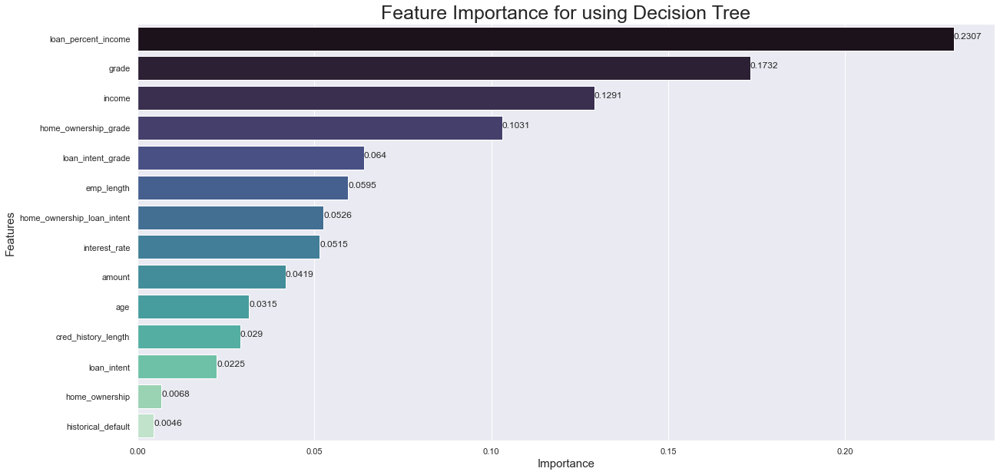

In [25]:
clf.fit(X_train_i , y_train_i)
importances = list(clf.feature_importances_)
columns = list(X_train_i.columns.values)
n = len(importances)
for i in range(len(importances)-1):
    for j in range(0,n-i-1):
        if importances[j]<importances[j+1]:
            importances[j], importances[j+1] = importances[j+1], importances[j]
            columns[j], columns[j+1] = columns[j+1], columns[j]
            
plt.figure(figsize = (20,10))
fig = sns.barplot(y=columns,
            x=importances,
            palette='mako'
)
dt_ranking = columns
for index, value in enumerate(np.round(np.array(importances),4)):
    plt.text(value, index, str(value), fontsize=12)
plt.title('Feature Importance for using Decision Tree', fontsize=25)
plt.xlabel('Importance' , fontsize=15)
plt.ylabel('Features', fontsize=15)
# plt.savefig(fig_dir+'feat_impo_smoking_none.png')
plt.show()

#### L1 Regularisation Feature Importance

In [26]:
L1_ranking = hf.L1_feature_rankings(X_train_i, y_train_i)
L1_ranking

['income',
 'loan_intent',
 'home_ownership',
 'amount',
 'historical_default',
 'loan_percent_income',
 'home_ownership_loan_intent',
 'interest_rate',
 'emp_length',
 'cred_history_length',
 'grade',
 'home_ownership_grade',
 'loan_intent_grade',
 'age']

#### F-Value Score

c:\users\abdul\documents\_university work\data science 874\assignments\5. post-block assignment 3\env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0, 0.5, 'Features')

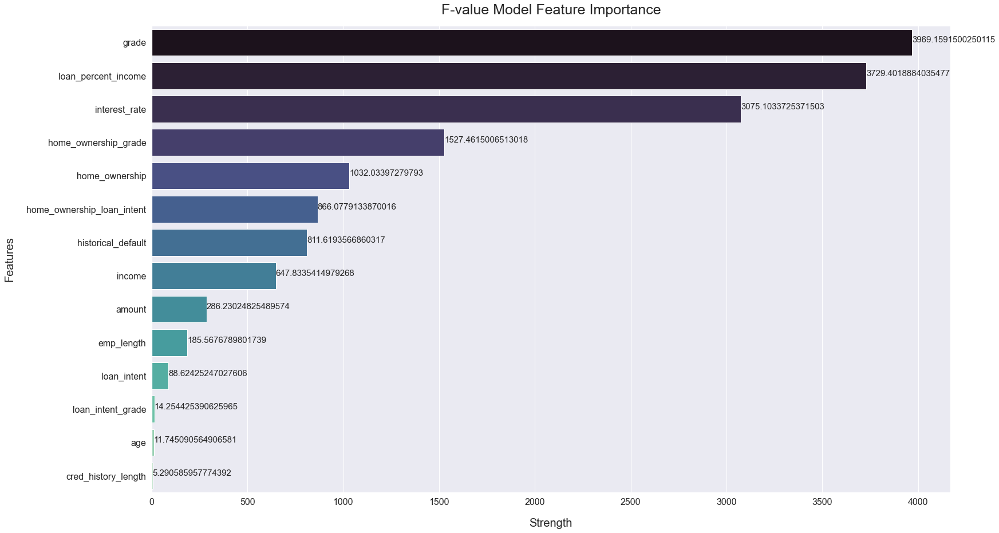

In [27]:
f_scores  = hf.feature_scores(X_train_i, y_train_i, score_func ='f_value_score')
f_score_list = list(f_scores.values())
f_key_list = list(f_scores.keys())
plt.figure(figsize=(25,15))
plt.rc('ytick',labelsize=16)
plt.rc('xtick',labelsize=16)
sns.barplot(
    f_score_list,
    f_key_list,
    palette="mako"
)
for index, value in enumerate(f_score_list):
    plt.text(value, index, str(value), fontsize=15)
plt.title("F-value Model Feature Importance",fontsize=25,pad=20)
plt.xlabel("Strength",fontsize=20,labelpad=20)
plt.ylabel("Features",fontsize=20,labelpad=20)


#### Mutual Information Score

c:\users\abdul\documents\_university work\data science 874\assignments\5. post-block assignment 3\env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0, 0.5, 'Features')

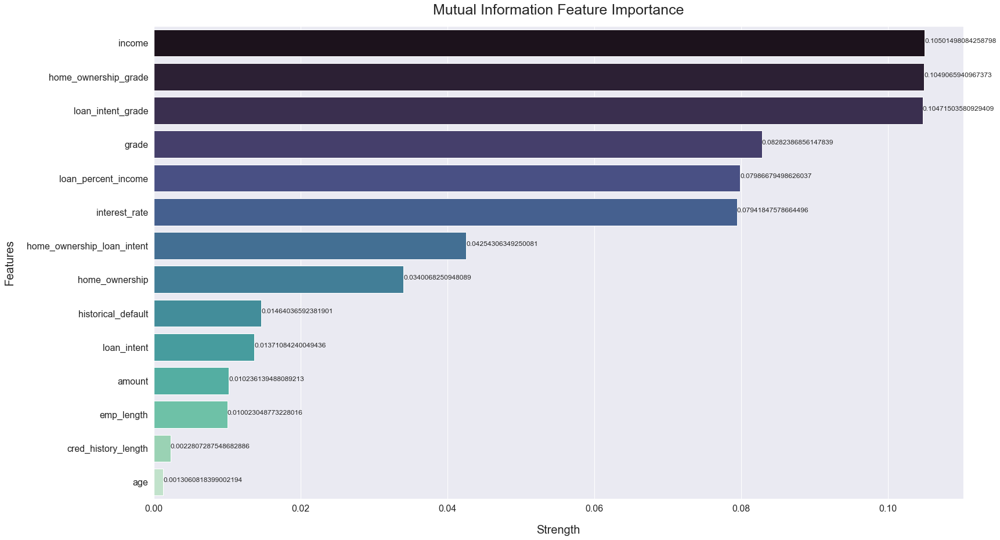

In [28]:
mi_scores  = hf.feature_scores(X_train_i, y_train_i, 'mutual_information_score')
mi_score_list = list(mi_scores.values())
mi_key_list = list(mi_scores.keys())
plt.figure(figsize=(25,15))
plt.rc('ytick',labelsize=16)
plt.rc('xtick',labelsize=16)
sns.barplot(
    mi_score_list,
    mi_key_list,
    palette="mako"
)
for index, value in enumerate(mi_score_list):
    plt.text(value, index, str(value),fontsize=12)
   
plt.title("Mutual Information Feature Importance",fontsize=25,pad=20)
plt.xlabel("Strength",fontsize=20,labelpad=20)
plt.ylabel("Features",fontsize=20,labelpad=20)


### Evaluation of Feature Selection Methods

In [29]:
ranking = list(mi_scores.keys())
mi_score_eval = {} 
for i in range(len(ranking)):
    feats = ranking[0:len(ranking)-i]
    mi_score_eval[len(ranking)-i] = cv_score(clf , X_train_i[feats] , y_train_i,cv=5,scoring=cv_metric).mean()

ranking = list(f_scores.keys())
f_score_eval = {} 
for i in range(len(ranking)):
    feats = ranking[0:len(ranking)-i]
    f_score_eval[len(ranking)-i] = cv_score(clf , X_train_i[feats] , y_train_i,cv=5,scoring=cv_metric).mean()

ranking = L1_ranking
L1_ranking_eval = {} 
for i in range(len(ranking)):
    feats = ranking[0:len(ranking)-i]
    L1_ranking_eval[len(ranking)-i] = cv_score(clf , X_train_i[feats] , y_train_i,cv=5,scoring=cv_metric).mean()

ranking = dt_ranking
dt_ranking_eval = {} 
for i in range(len(ranking)):
    feats = ranking[0:len(ranking)-i]
    dt_ranking_eval[len(ranking)-i] = cv_score(clf , X_train_i[feats] , y_train_i,cv=5,scoring=cv_metric).mean()
    


Text(151.5, 0.5, 'Number of features')

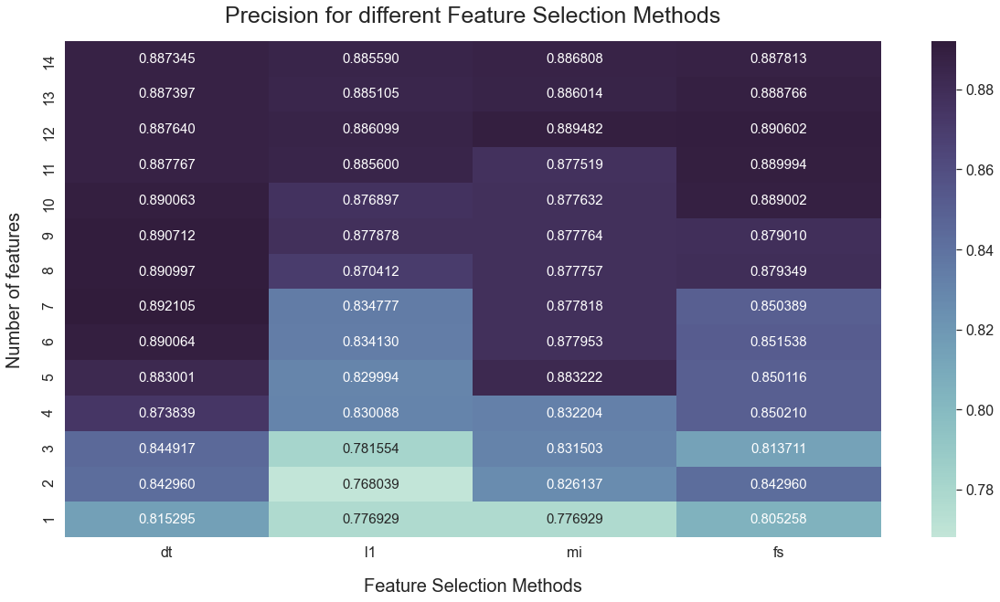

In [37]:
columns = ['dt','l1','mi','fs']
index = list(dt_ranking_eval.keys())
precision_df = pd.DataFrame(index=index,columns=columns)
precision_df.dt = dt_ranking_eval.values()
precision_df.l1 = L1_ranking_eval.values()
precision_df.mi=mi_score_eval.values()
precision_df.fs=f_score_eval.values()

sns.heatmap(precision_df,
            annot=True,
            fmt='f',
            cmap=sns.cubehelix_palette(start=.5, rot=-.5, as_cmap=True),
            annot_kws={"fontsize":15}
) 
plt.title("Precision for different Feature Selection Methods",fontsize=25,pad=20)
plt.xlabel("Feature Selection Methods",fontsize=20,labelpad=20)
plt.ylabel("Number of features",fontsize=20,labelpad=20)


### Feature Correlation Matrix

Text(151.21875, 0.5, 'Features')

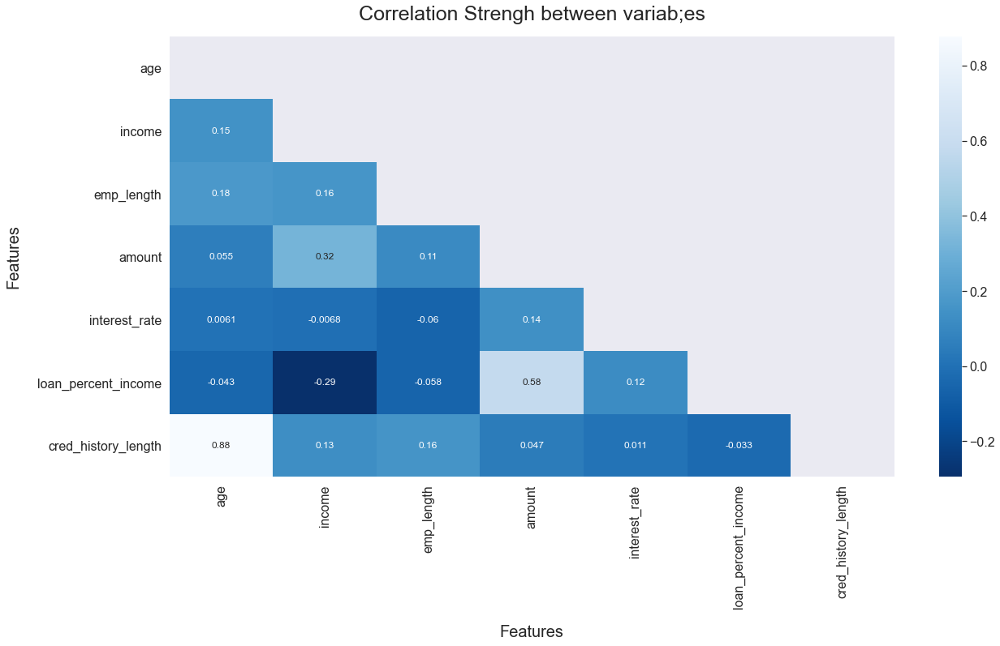

In [41]:
train = X_train_i.join(y_train_i)[numeric_feats]
plt.figure(figsize=(20, 10))
mask = np.triu(np.ones_like(train.corr()))
sns.heatmap(train.corr(),annot=True,mask=mask,cmap='Blues_r')
plt.title("Correlation Strengh between variab;es",fontsize=25,pad=20)
plt.xlabel("Features",fontsize=20,labelpad=20)
plt.ylabel("Features",fontsize=20,labelpad=20)
